# Latest Version of `transformers`

In [1]:
pip install git+https://github.com/huggingface/transformers.git

  Cloning https://github.com/huggingface/transformers.git to /tmp/pip-req-build-6p3ogku4
  Running command git clone --filter=blob:none --quiet https://github.com/huggingface/transformers.git /tmp/pip-req-build-6p3ogku4
  Resolved https://github.com/huggingface/transformers.git to commit 1094dd34f73dae1d9a91a6632635934516612490
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for transformers: filename=transformers-4.53.0.dev0-py3-none-any.whl size=11382096 sha256=3b5ffd21725da2f4d3f6779256ea10e5ed0543b71115dd3891f1a6233d087257
  Stored in directory: /tmp/pip-ephem-wheel-cache-86gzicgc/wheels/32/4b/78/f195c684dd3a9ed21f3b39fe8f85b48df7918581b6437be143
Successfully built transformers
  Attempting uninstall: transformers
    Found existing installation: transformers 4.52.2
    Uninstalling transformers-4.52.2:
      Successfully uninstalled transformers-4.52.2


# import required Library


In [2]:
from transformers import ViTFeatureExtractor, ViTForImageClassification
from PIL import Image
import requests

# Download Image from the given URL

In [3]:
#url = 'http://images.cocodataset.org/val2017/000000039769.jpg'

url = 'https://external-content.duckduckgo.com/iu/?u=https%3A%2F%2Fstatic.politico.com%2F40%2F9e%2Ff99de3ed45a48efba1883868c884%2Fwhite-house.jpg&f=1&nofb=1'
image = Image.open(requests.get(url, stream=True).raw)

# Display The downloaded image

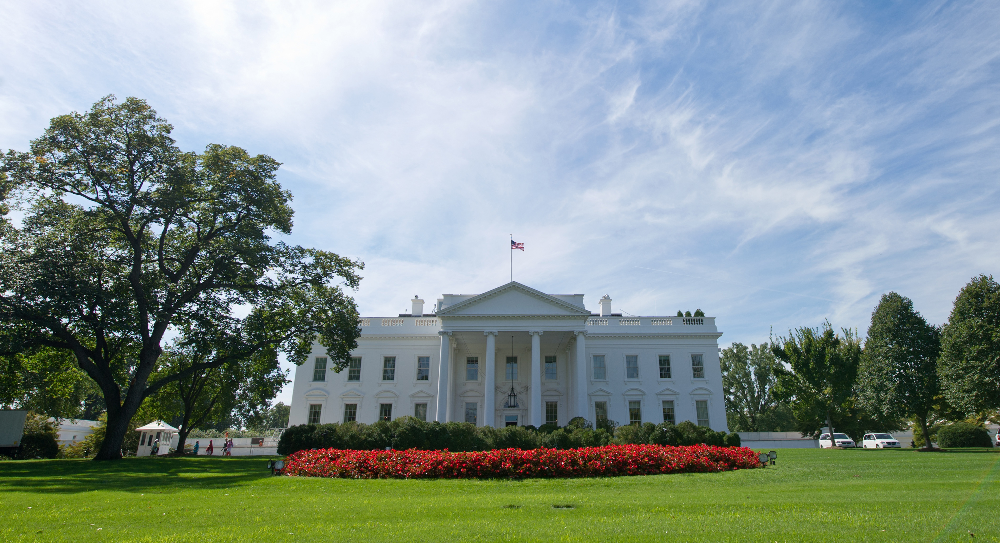

In [4]:
#from IPython.display import Image
display(image)


# Pre-trained Model

In [5]:
feature_extractor = ViTFeatureExtractor.from_pretrained('google/vit-base-patch16-224')
model = ViTForImageClassification.from_pretrained('google/vit-base-patch16-224')


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

/usr/local/lib/python3.11/dist-packages/transformers/models/vit/feature_extraction_vit.py:30: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(


config.json:   0%|          | 0.00/69.7k [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

# Extract Features

In [6]:
inputs = feature_extractor(images=image, return_tensors="pt")


# Model Inference

In [7]:
outputs = model(**inputs)


In [8]:
logits = outputs.logits


# model predicts one of the 1000 ImageNet classes

In [9]:

predicted_class_idx = logits.argmax(-1).item()
print("Predicted class:", model.config.id2label[predicted_class_idx])

Predicted class: palace
